In [88]:
import numpy as np
from tqdm import tqdm # Per vedere il processo di completamento nei cicli for

# Gestione immagini
from skimage import io # Per input/output
from skimage import transform # Per trasformazioni geometriche (es. resize)
from skimage import filters # Per filtri locali
from skimage import color # Per cambi colore

# Visualizzazione e interazione
from matplotlib import pyplot as plt
import ipywidgets as widgets

In [132]:
plt.rcParams['figure.figsize'] = [10,10] #Dimensioni immagini standard

## Carico e mostro immagine

In [90]:
fog = io.imread('fog.jpg', as_gray=True)
fog.shape

(2616, 3488)

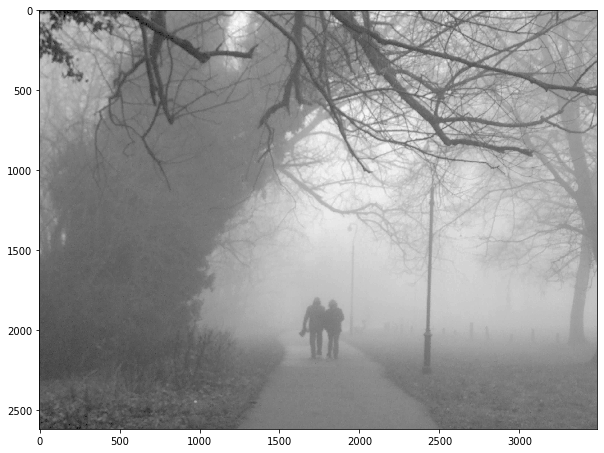

In [91]:
plt.imshow(fog, cmap="gray")

In [92]:
# Resize dell'immagine (30%)
new_shape = (int(fog.shape[0]*0.3), int(fog.shape[1]*0.3))

fog = transform.resize(fog, new_shape)

## Creo sharpening

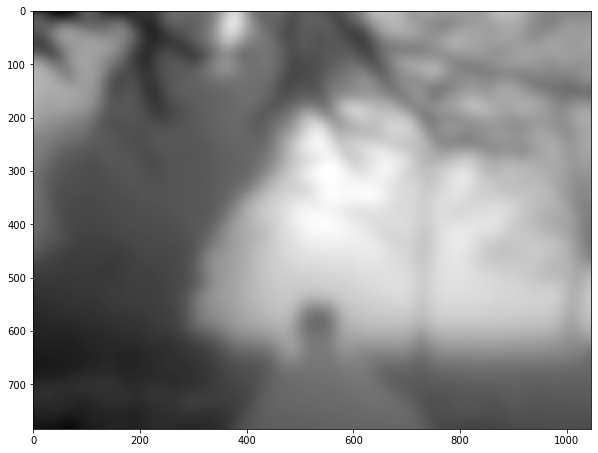

In [128]:
# Immagine sfocata

fog_blur = filters.gaussian(fog, sigma = 15) # più il parametro sigma è alto più l'effetto blur è elevato

plt.imshow(fog_blur, cmap = "gray")

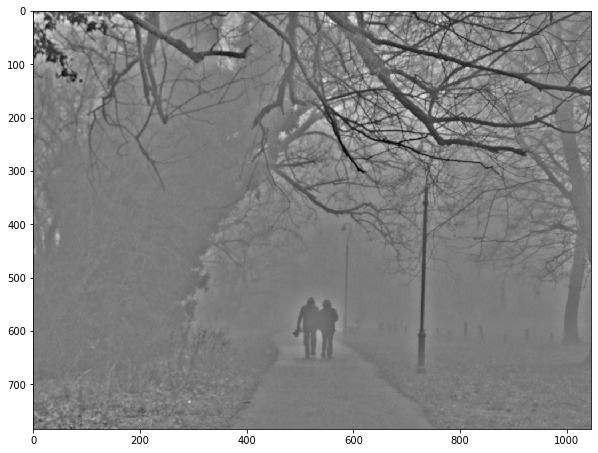

In [129]:
# Dettagli

details = fog - fog_blur

plt.imshow(details, cmap = "gray")

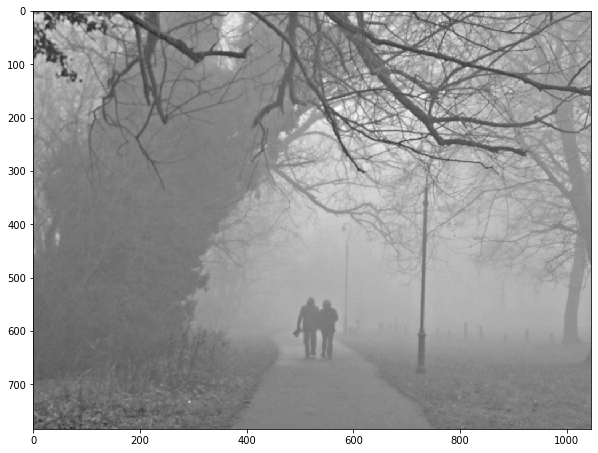

In [130]:
# Sharp: creazione immagine finale

sharp = fog + details

plt.imshow(sharp, cmap = "gray")

Text(0.5, 1.0, 'Immagine elaborata')

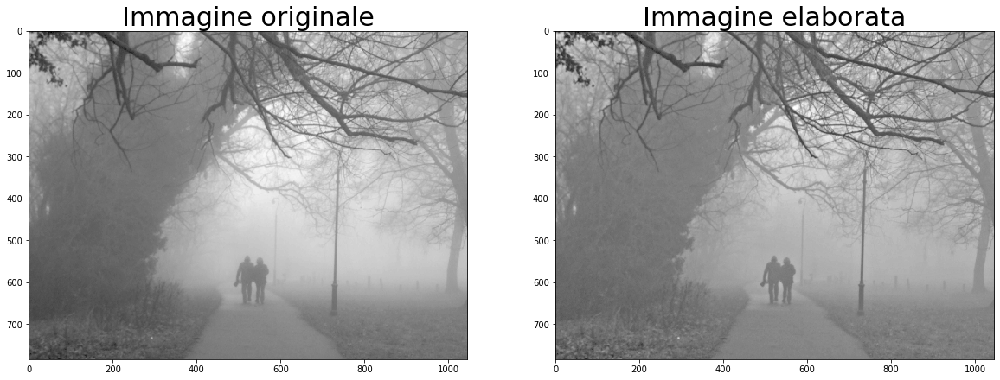

In [131]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (20,20))
ax1.imshow(fog, cmap = "gray")
ax1.set_title("Immagine originale", fontsize=30)
ax2.imshow(sharp, cmap = "gray")
ax2.set_title("Immagine elaborata", fontsize=30)

### Si vede la differenza tra l'immagine originale e quella trasformata nelle zone con più "cambi" (particolari) ad esempio in alto dove sono presenti molti rami

## Confronto tra diversi Sigma 

In [106]:
images = []
for i in tqdm(range(20,110, 10)):
    fog_blur = filters.gaussian(fog, sigma = i)
    details = fog - fog_blur
    images.append(fog + details)

100%|██████████| 9/9 [00:03<00:00,  2.62it/s]


Text(0.5, 1.0, 'Sigma = 100')

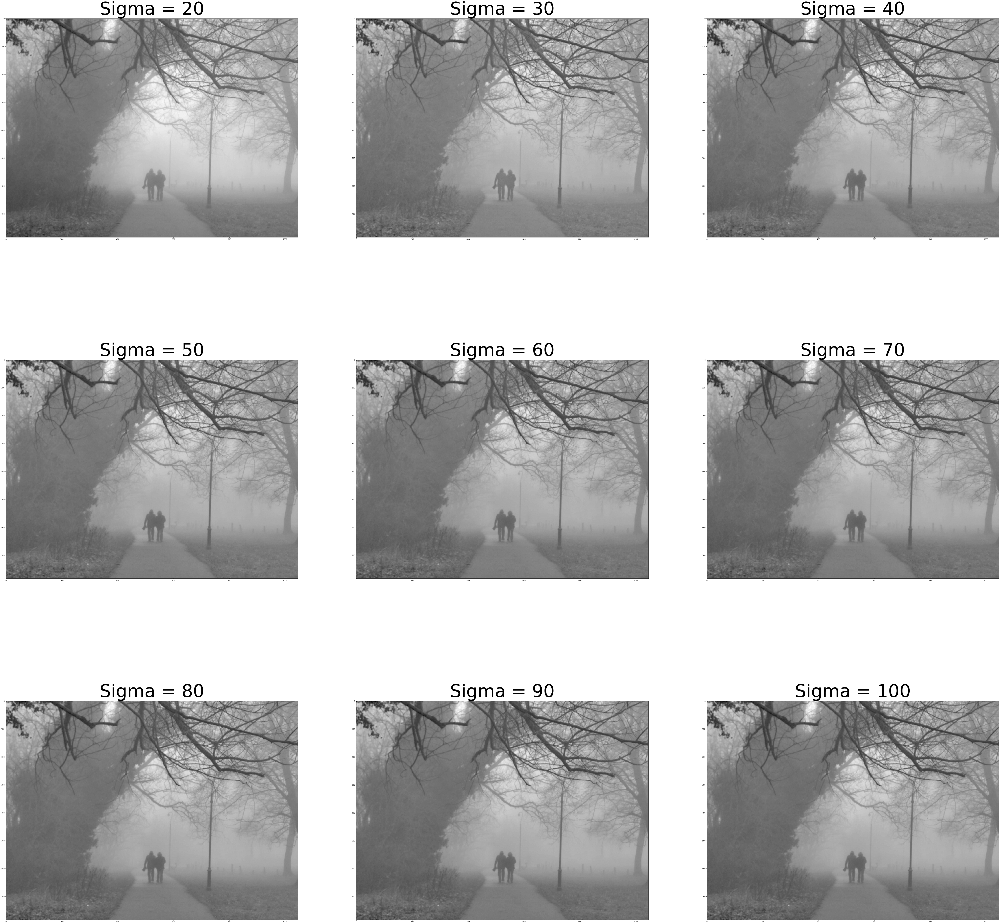

In [113]:
# Plot delle immagini con diversi sigma

f, axarr = plt.subplots(3,3,figsize=(100,100))

axarr[0,0].imshow(images[0], cmap = "gray")
axarr[0,0].set_title("Sigma = 20", fontsize=100)
axarr[0,1].imshow(images[1], cmap = "gray")
axarr[0,1].set_title("Sigma = 30", fontsize=100)
axarr[0,2].imshow(images[2], cmap = "gray")
axarr[0,2].set_title("Sigma = 40", fontsize=100)
axarr[1,0].imshow(images[3], cmap = "gray")
axarr[1,0].set_title("Sigma = 50", fontsize=100)
axarr[1,1].imshow(images[4], cmap = "gray")
axarr[1,1].set_title("Sigma = 60", fontsize=100)
axarr[1,2].imshow(images[5], cmap = "gray")
axarr[1,2].set_title("Sigma = 70", fontsize=100)
axarr[2,0].imshow(images[6], cmap = "gray")
axarr[2,0].set_title("Sigma = 80", fontsize=100)
axarr[2,1].imshow(images[7], cmap = "gray")
axarr[2,1].set_title("Sigma = 90", fontsize=100)
axarr[2,2].imshow(images[8], cmap = "gray")
axarr[2,2].set_title("Sigma = 100", fontsize=100)

### Più sigma è alto più i dettagli vengono sottolineati